In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
from PIL import Image
import scipy.spatial
from itertools import product
import sys

In [2]:
images = {} #this will store images of each person
#loading all images into the "images" dictionary
size = 100

for image_str in os.listdir('pics'):
    name_arr = image_str.split('-')
    name = name_arr[0] +' ' + name_arr[1]
    if images.get(name,0) == 0:
        images[name] = []
    img = Image.open('pics/'+image_str)
    new_img = img.resize((size,size))    #resize all pics to same size
    images[name].append(new_img.convert('L'))

num_faces = len(images.keys())*4


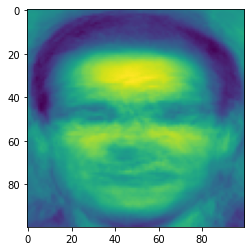

(100, 100)

In [3]:
avg_face = np.zeros((size,size))


for key in images.keys():
    for i in range(4):
        avg_face += np.array(images[key][i].convert('L'))

        
avg_face /= num_faces
plt.imshow(avg_face)
plt.show()
avg_face.shape

In [4]:
A = np.empty((len(images.keys())*4,size*size))

face_idx = 0
for key in images.keys():
    for i in range(4):
        orig_face = images[key][i].convert('L')
        A[face_idx] = (np.array(orig_face)-avg_face).flatten()
        face_idx+=1

In [5]:
A = A.T


In [6]:
L = np.matmul(A.T,A)
L /= num_faces


In [7]:
A.shape

(10000, 40)

In [8]:
L.shape

(40, 40)

In [9]:
evals, evects = np.linalg.eig(L)

sort_indices = evals.argsort()[::-1]                             
evals = evals[sort_indices]                               
evects = evects[:,sort_indices]

M_prime = (40)
evals = evals[:M_prime]
evects = evects[:,:M_prime]

In [10]:
sort_indices

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 16, 17,
       18, 19, 20, 21, 22, 27, 28, 31, 32, 33, 34, 36, 37, 39, 38, 35, 30,
       29, 26, 25, 24, 23, 15], dtype=int64)

In [11]:
np.diff(evals)

array([-2358724.62090011,  -528916.6013032 , -1070292.90763486,
        -756439.87419698,  -322889.71029866,  -112544.92064861,
        -177686.22575304,  -118688.26247727,   -89570.9232947 ,
         -67557.72586393,   -79013.60726031,   -60119.48135671,
         -37173.21623282,   -16920.51867654,   -38506.11860439,
         -43611.49950123,   -15142.58522056,   -46700.00500423,
          -7323.36022488,   -14779.78958174,   -16673.08214072,
         -37614.90131448,    -4914.87222372,   -14428.25105083,
          -7714.49912988,   -10600.76700947,   -10779.39615031,
         -11189.51567414,    -7389.60602926,    -7306.35463969,
          -4090.932976  ,   -10378.85094766,   -10928.98692664,
          -7020.48290716,   -15143.25669903,   -10303.62381979,
          -6138.74272212,   -15052.1107688 ,   -88309.15272637])

In [12]:
evects = np.dot(A,evects)

In [13]:
for i in range(M_prime):
    
    evects[:,i] = evects[:,i]/np.linalg.norm(evects[:,i])

In [31]:
np.set_printoptions(threshold=sys.maxsize)
print(evects[:,1])
np.set_printoptions(threshold=1000)

[-4.87879928e-03 -5.56352289e-03 -6.04187922e-03 -6.22560130e-03
 -6.49695464e-03 -6.53605577e-03 -6.59431068e-03 -6.84047245e-03
 -7.00298339e-03 -7.81395107e-03 -8.45645623e-03 -1.02112455e-02
 -1.07658777e-02 -1.03549770e-02 -1.01679500e-02 -9.59929902e-03
 -9.25045352e-03 -9.15706962e-03 -8.22729779e-03 -7.23603199e-03
 -6.90125509e-03 -7.45353646e-03 -8.30726981e-03 -8.63706761e-03
 -8.65416895e-03 -8.87587047e-03 -8.65011563e-03 -7.90008366e-03
 -6.48353032e-03 -4.37477453e-03 -2.41792856e-03 -1.16844334e-03
 -1.20538481e-03 -1.09293892e-03 -6.28074764e-04 -2.06088238e-04
  6.06620898e-04  2.19482322e-03  3.03632056e-03  3.55866445e-03
  3.55614739e-03  4.84830913e-03  6.76736619e-03  7.12641006e-03
  6.56727069e-03  5.41323977e-03  5.09595900e-03  6.02245701e-03
  7.56803558e-03  8.19666015e-03  8.56018085e-03  8.87933632e-03
  8.71923656e-03  8.45494248e-03  7.63987580e-03  6.73913564e-03
  6.43075662e-03  5.69858251e-03  4.75737800e-03  4.74463109e-03
  6.24602658e-03  7.90302

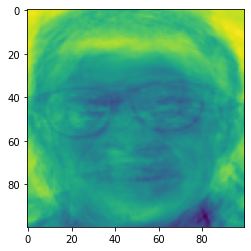

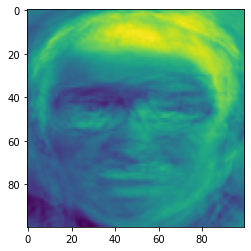

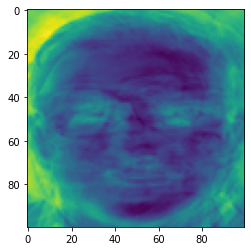

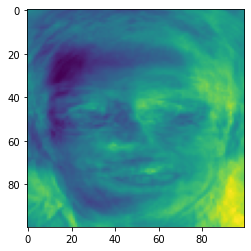

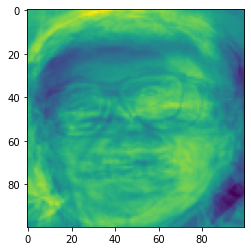

...

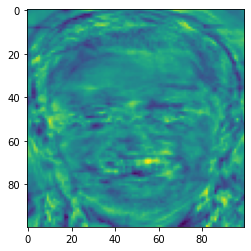

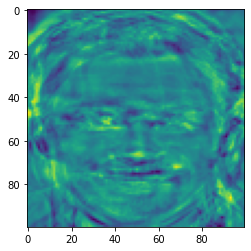

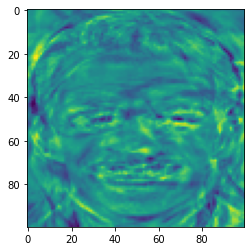

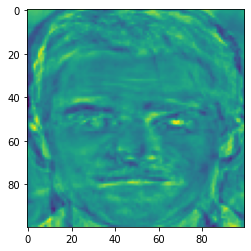

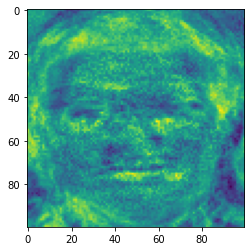

In [14]:
for i in range(M_prime):
    temp = evects[:,i].reshape(100,100)
    plt.imshow(temp)
    plt.show()

In [15]:
W_k = np.dot(evects.T,A)

In [16]:
#now onto testing:

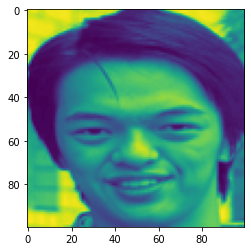

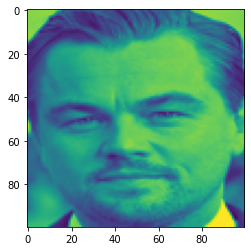

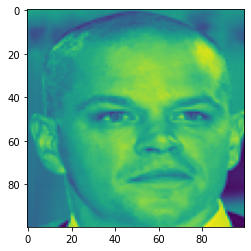

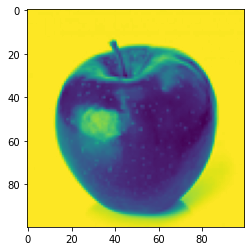

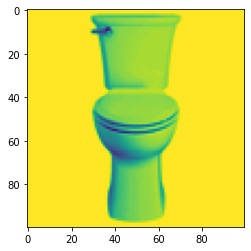

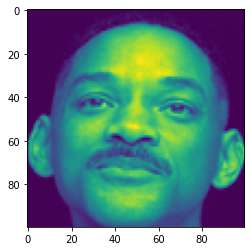

In [17]:
new_faces = {}
for image_str in os.listdir('test'):
    name_arr = image_str.split('-')
    name = name_arr[0] +' ' + name_arr[1]
    img = Image.open('test/'+image_str)
    img = img.resize((size,size)).convert('L')
    new_faces[name] = img.convert('L')
    
    plt.imshow(img)
    plt.show()

In [18]:
def solve(image):
    img = (image - avg_face).reshape(size*size,1)

    W = np.dot(evects.T,img)
    norms = np.linalg.norm(W-W_k, axis = 0)

#     avg_norms = np.zeros(int(num_faces/4))
#     for i in range(len(avg_norms)):
#         for j in range(4):
#             avg_norms[i] += norms[i*4+j]
#     avg_norms/=4
# #     print(avg_norms) #check for recognition
    phi_hat = np.zeros(size*size)
    phi = img.reshape(size*size)
    for i in range(M_prime):
#         print(evects.shape)
#         print(evects.T[i].shape)
#         print(phi.shape)
#         print(evects[i].shape)
#         print(np.dot(evects.T[i],phi))
        phi_hat += evects.T[i]@phi* evects.T[i]
    plt.imshow(phi_hat.reshape((100,100)))
    plt.show()
    norms_phi = np.linalg.norm(phi-phi_hat.reshape(size*size), axis = 0)

    norms_phi #check for detection

#     idx = np.argmin(avg_norms)
    detection_threshold = 6000
#     recognition_threshold = 7000
    if norms_phi <detection_threshold:
        print("We classify this as a face")
        print(norms_phi)
        plt.imshow(img.reshape((size,size)))
        plt.show()
        return True
    else:
        print("We classify this as not a face")
        print(norms_phi)
        return False
    



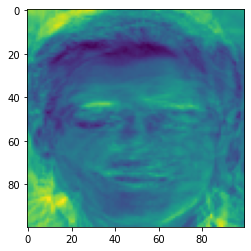

We classify this as a face
3515.859525475475


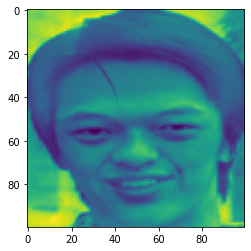

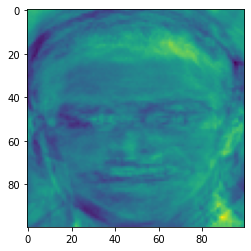

We classify this as a face
3455.620153864016


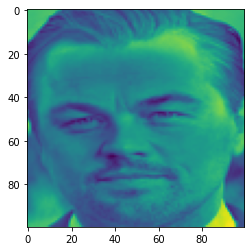

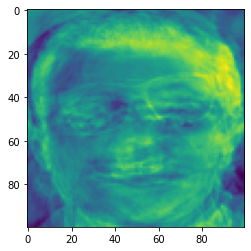

We classify this as a face
2755.5812475170883


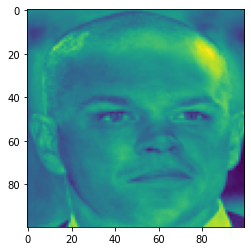

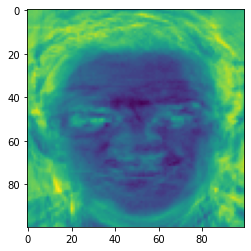

We classify this as a face
4783.882090081769


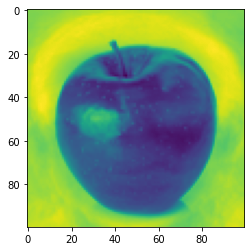

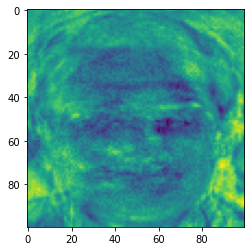

We classify this as a face
4961.123867304026


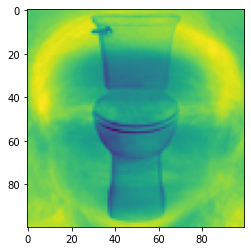

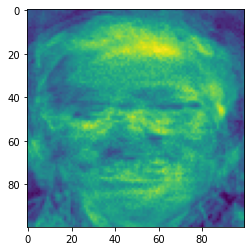

We classify this as a face
3730.607854167996


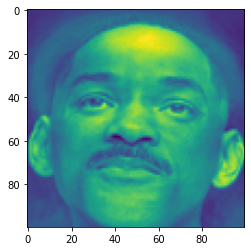

In [19]:
for key in new_faces.keys():
    img = new_faces[key]
    solve(img)



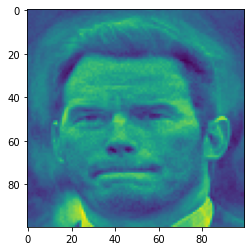

We classify this as a face
1423.2140723097555


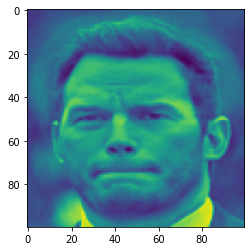

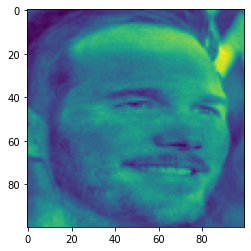

We classify this as a face
1098.3939542297683


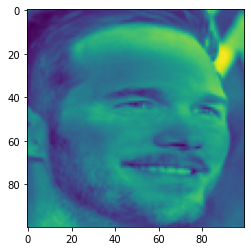

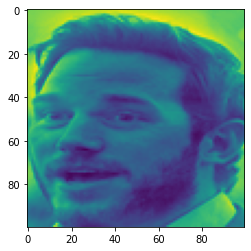

We classify this as a face
99.53307751401086


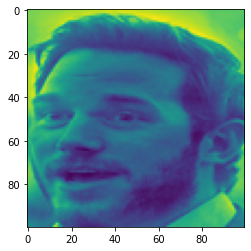

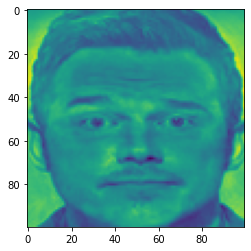

We classify this as a face
169.67901368162185


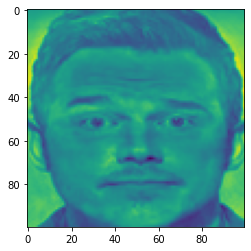

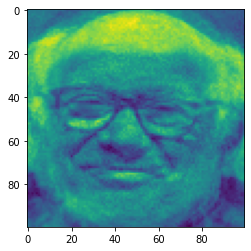

We classify this as a face
2695.727908121437


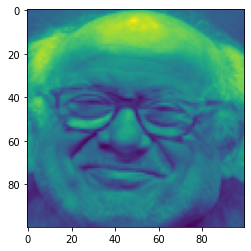

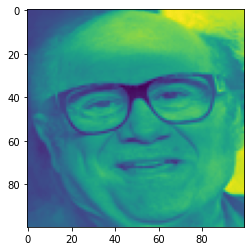

We classify this as a face
129.4851299652537


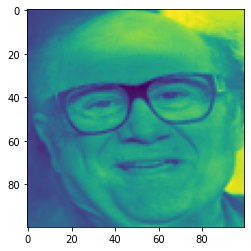

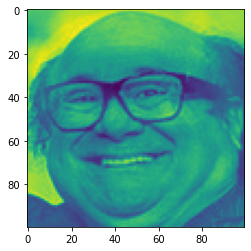

We classify this as a face
462.27022195738385


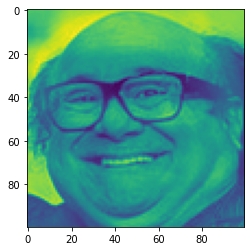

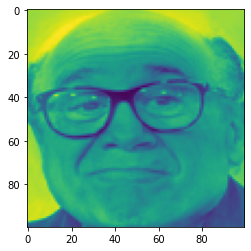

We classify this as a face
91.81101638671775


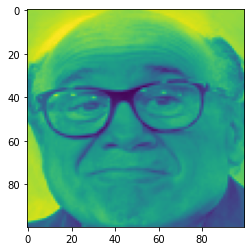

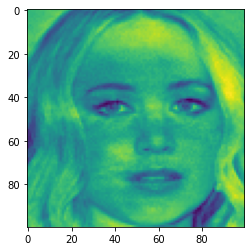

We classify this as a face
954.1498333340869


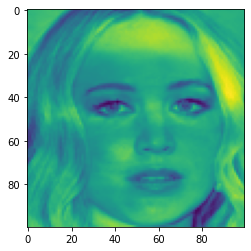

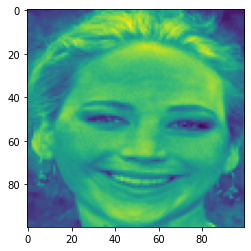

We classify this as a face
443.46502379897987


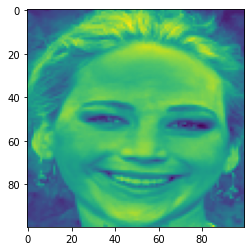

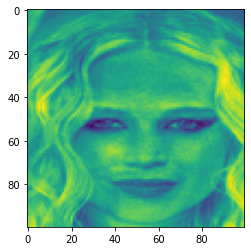

We classify this as a face
732.0122752525509


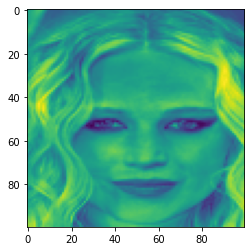

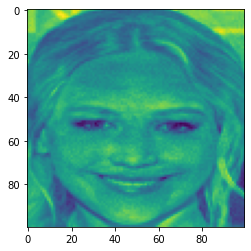

We classify this as a face
1116.0629125481946


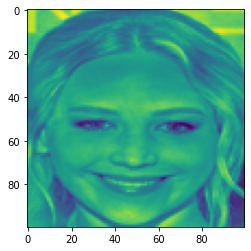

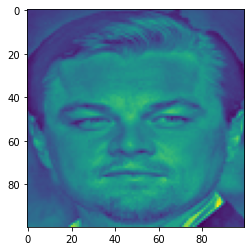

We classify this as a face
129.48977234406436


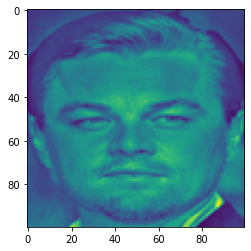

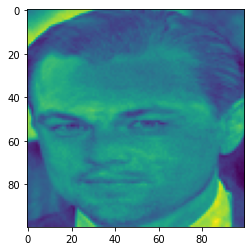

We classify this as a face
742.3263868972354


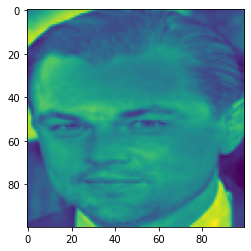

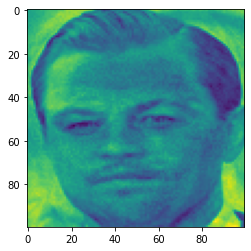

We classify this as a face
1486.7301493824652


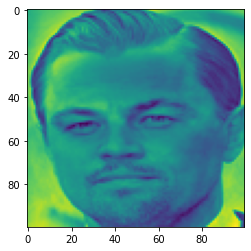

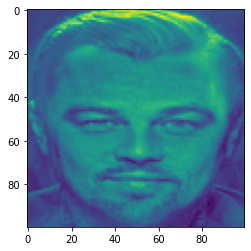

We classify this as a face
739.5082953442826


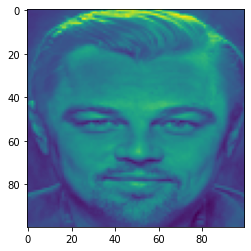

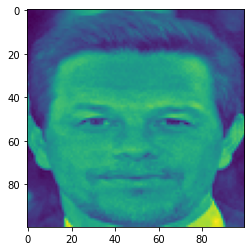

We classify this as a face
701.7682522256339


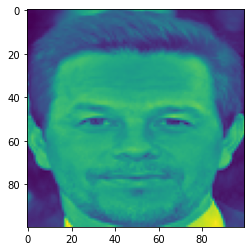

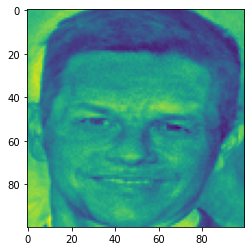

We classify this as a face
1186.8865160732012


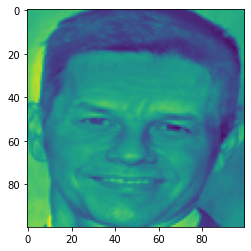

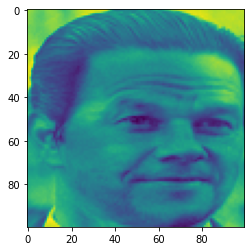

We classify this as a face
524.0977565871391


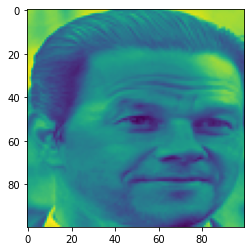

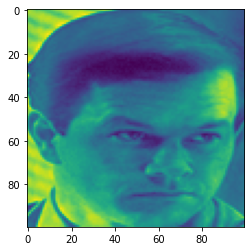

We classify this as a face
563.6312343948684


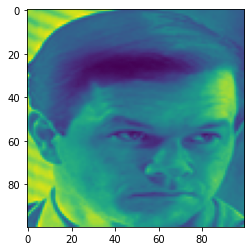

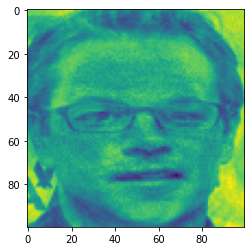

We classify this as a face
2398.753373998923


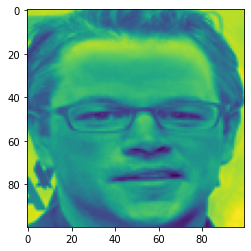

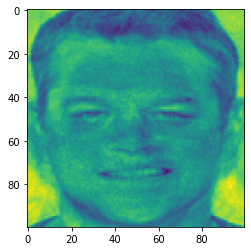

We classify this as a face
1503.4960305234522


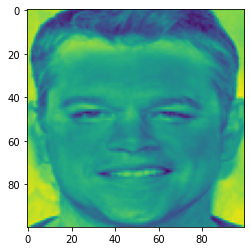

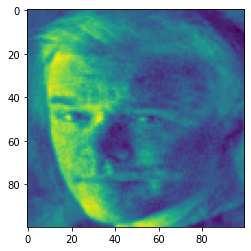

We classify this as a face
1181.6203425926526


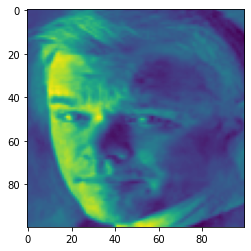

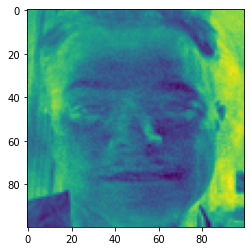

We classify this as a face
1672.060839604263


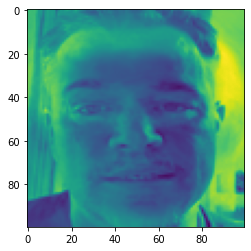

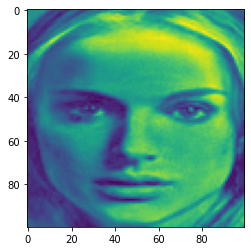

We classify this as a face
669.9311931196233


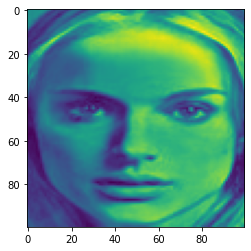

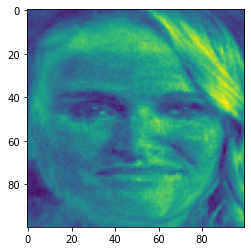

We classify this as a face
1796.1138848530907


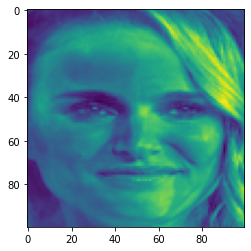

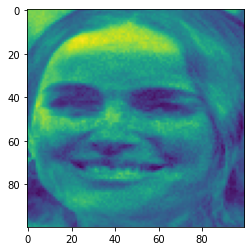

We classify this as a face
2087.9662335283133


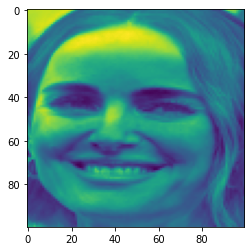

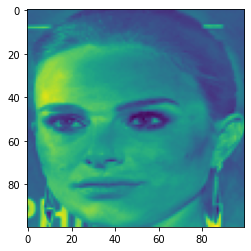

We classify this as a face
187.0980757987298


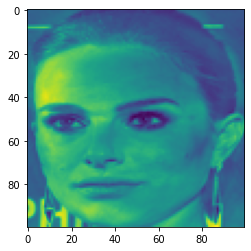

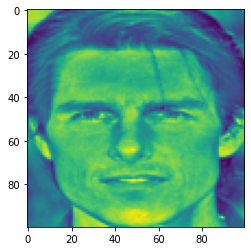

We classify this as a face
252.90603202684647


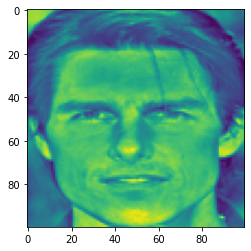

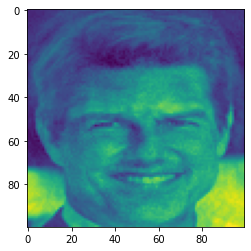

We classify this as a face
1457.2881172926527


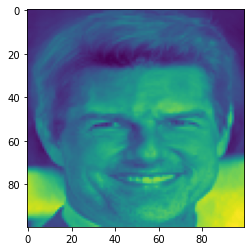

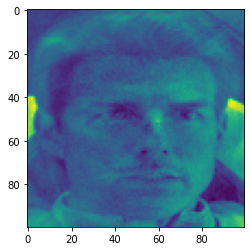

We classify this as a face
1097.8629305036281


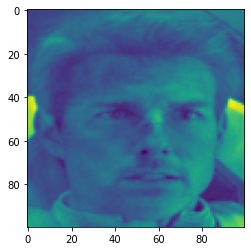

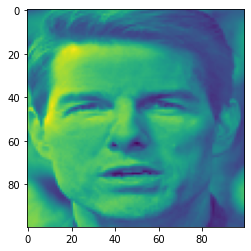

We classify this as a face
197.58645178091004


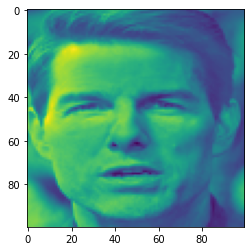

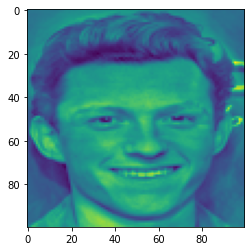

We classify this as a face
200.6912969407391


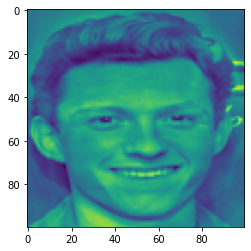

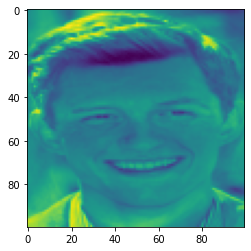

We classify this as a face
65.90022291166586


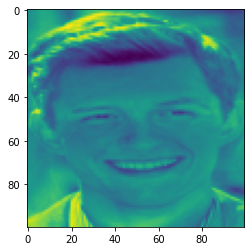

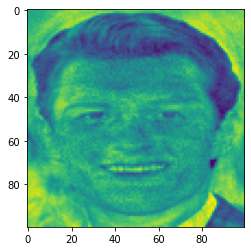

We classify this as a face
1941.3372839312492


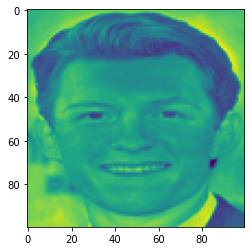

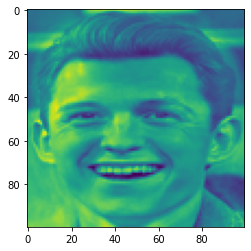

We classify this as a face
65.63161324175981


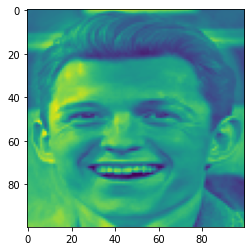

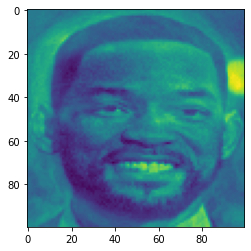

We classify this as a face
1223.6874170409667


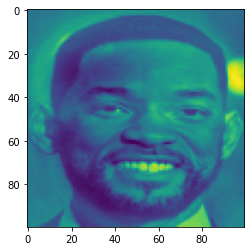

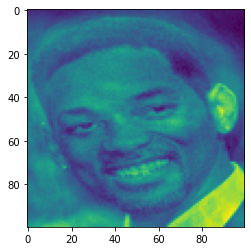

We classify this as a face
1029.645151202872


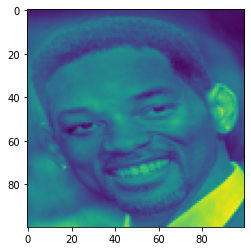

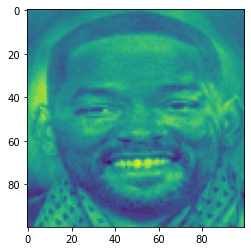

We classify this as a face
1166.285436067038


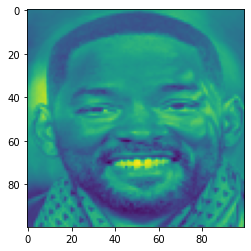

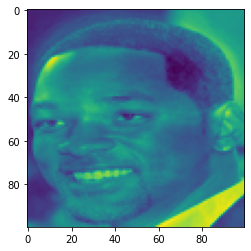

We classify this as a face
224.15257880244866


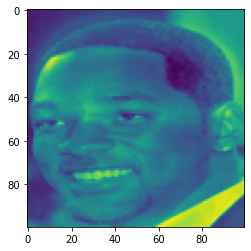

In [20]:
for key in images.keys():
    for j in range(4):
        img = images[key][j]
        solve(img)

friends.jpg


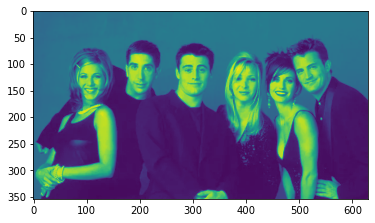

one_man.jpg


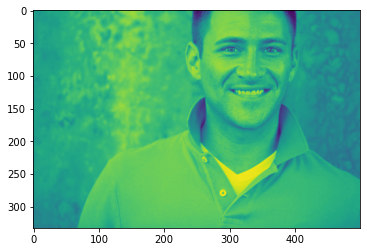

one_woman.jpg


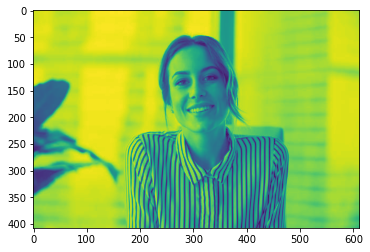

In [21]:
current_dir = 'full_images'
full_img = {}
for image_str in os.listdir(current_dir):
    name = image_str
    img = Image.open(current_dir+'/'+image_str)
#     img = img.resize((size,size)).convert('L')
    full_img[name] = img.convert('L')
    print(name)
    
    plt.imshow(full_img[name])
    plt.show()

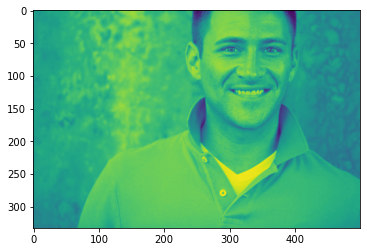

In [22]:
img = full_img['one_man.jpg']
plt.imshow(img)
plt.show()

(0, 0, 150, 150)


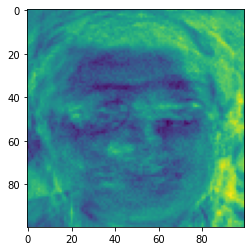

We classify this as a face
2370.043967195045


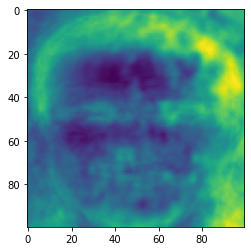

(0, 37, 150, 187)


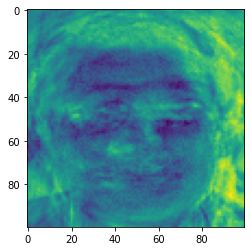

We classify this as a face
2326.581230292216


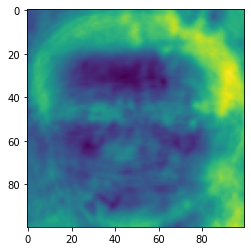

(0, 74, 150, 224)


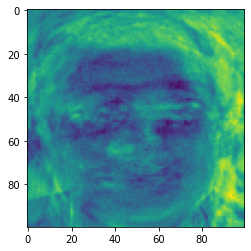

We classify this as a face
2249.280631576151


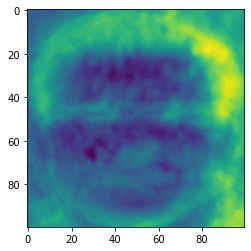

(0, 111, 150, 261)


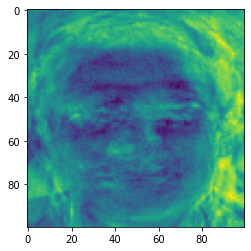

We classify this as a face
2219.1732548328923


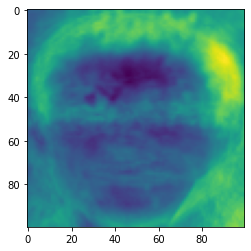

(0, 148, 150, 298)


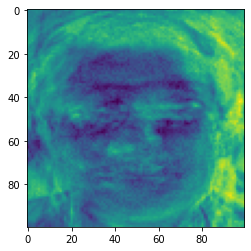

We classify this as a face
2286.891172166639


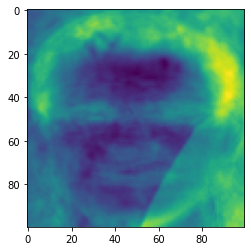

(37, 0, 187, 150)


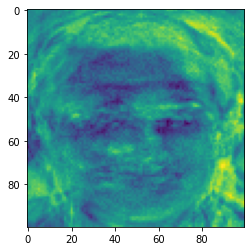

We classify this as a face
2653.3971330635677


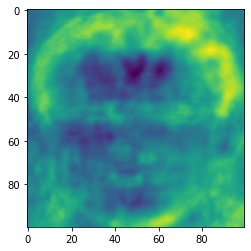

(37, 37, 187, 187)


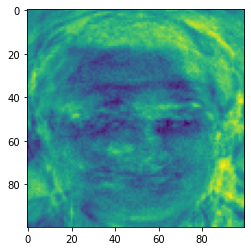

We classify this as a face
2649.208191590411


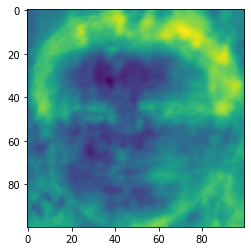

(37, 74, 187, 224)


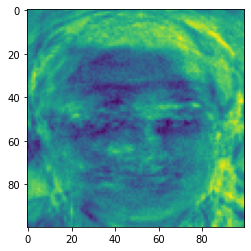

We classify this as a face
2649.389774770878


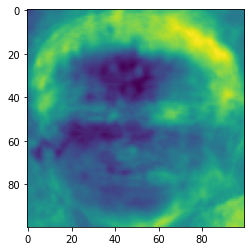

(37, 111, 187, 261)


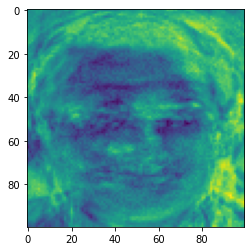

We classify this as a face
2664.7871672342885


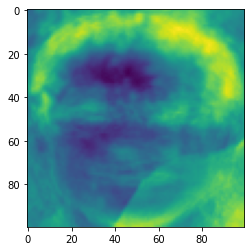

(37, 148, 187, 298)


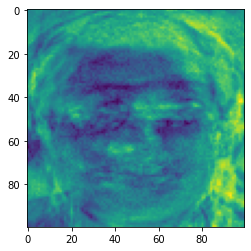

We classify this as a face
2576.356065818384


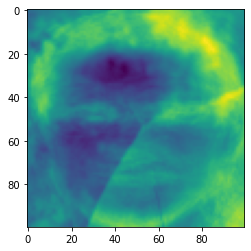

(74, 0, 224, 150)


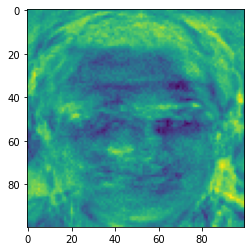

We classify this as a face
2629.538563657137


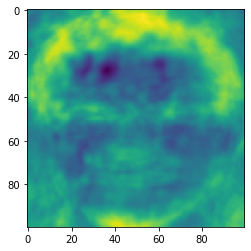

(74, 37, 224, 187)


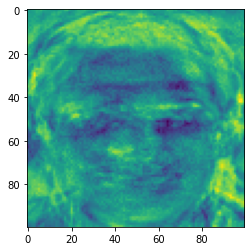

We classify this as a face
2593.5359194720986


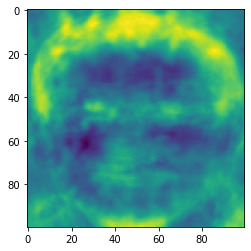

(74, 74, 224, 224)


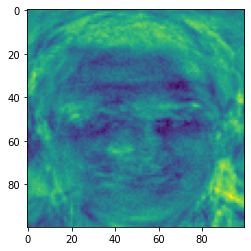

We classify this as a face
2697.952780110166


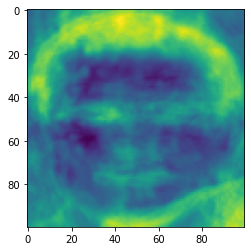

(74, 111, 224, 261)


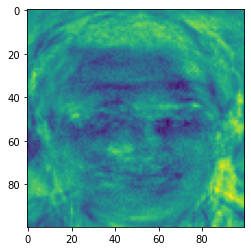

We classify this as a face
2672.1646811795163


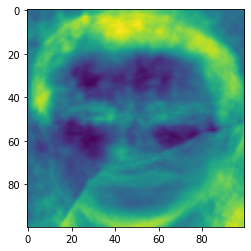

(74, 148, 224, 298)


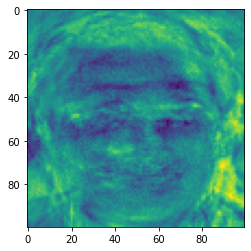

We classify this as a face
2714.5103616059137


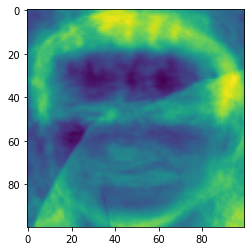

(111, 0, 261, 150)


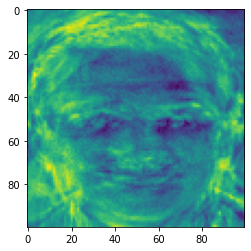

We classify this as a face
2738.635967535889


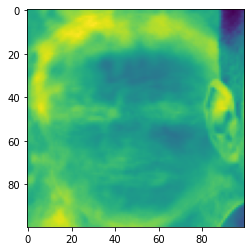

(111, 37, 261, 187)


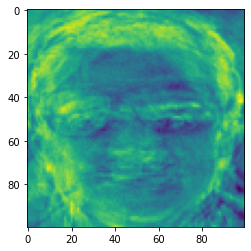

We classify this as a face
2549.9491934943353


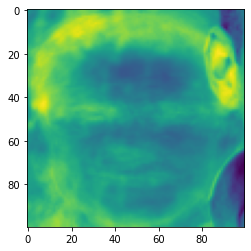

(111, 74, 261, 224)


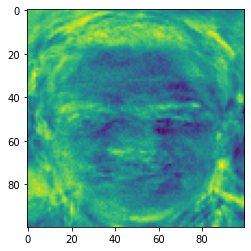

We classify this as a face
3102.8525425793755


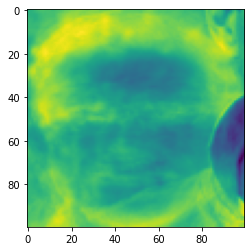

(111, 111, 261, 261)


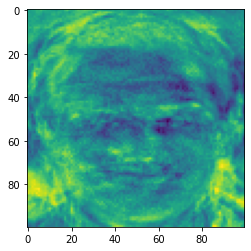

We classify this as a face
3018.5992852542536


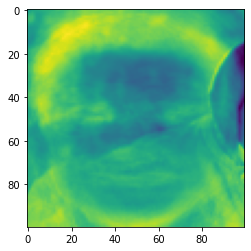

(111, 148, 261, 298)


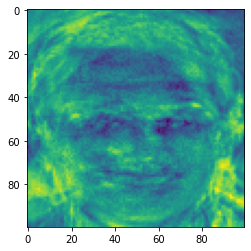

We classify this as a face
3083.262679875002


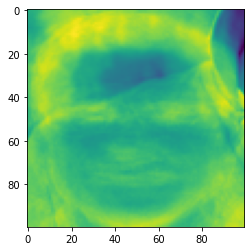

(148, 0, 298, 150)


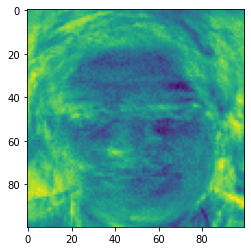

We classify this as a face
3147.831703747843


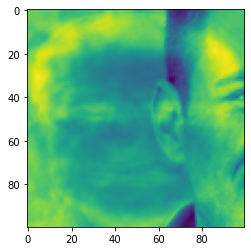

(148, 37, 298, 187)


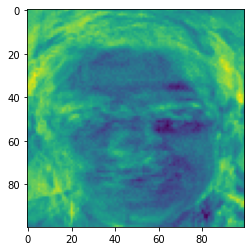

We classify this as a face
2940.619119414691


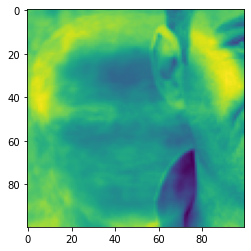

(148, 74, 298, 224)


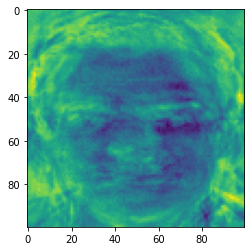

We classify this as a face
2954.4855238977284


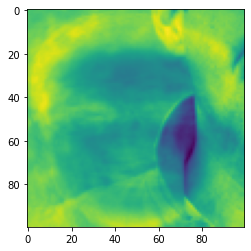

(148, 111, 298, 261)


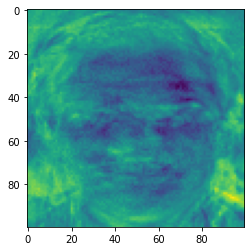

We classify this as a face
3046.5635586592207


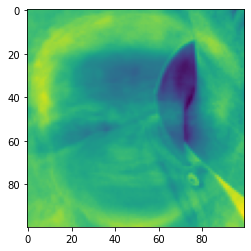

(148, 148, 298, 298)


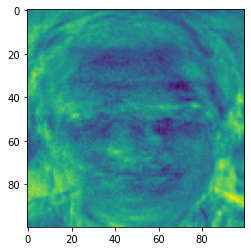

We classify this as a face
3219.068532256816


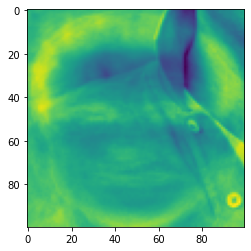

(185, 0, 335, 150)


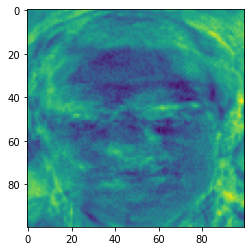

We classify this as a face
3455.3583107770696


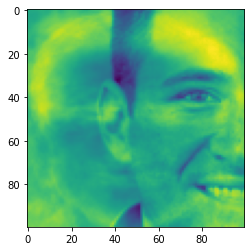

(185, 37, 335, 187)


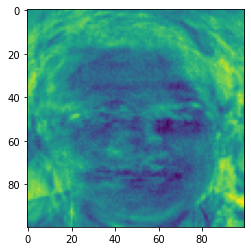

We classify this as a face
3259.8844482169275


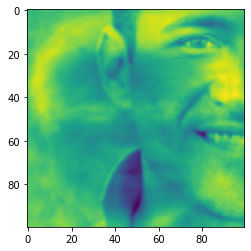

(185, 74, 335, 224)


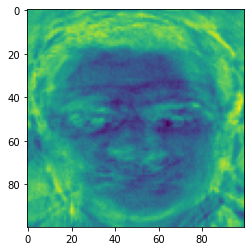

We classify this as a face
3198.5592007030345


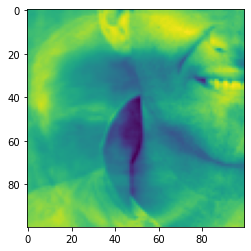

(185, 111, 335, 261)


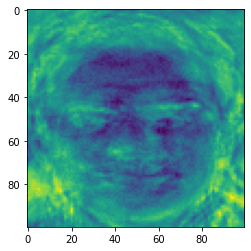

We classify this as a face
3452.5037780220487


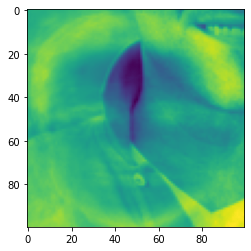

(185, 148, 335, 298)


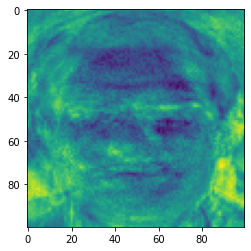

We classify this as a face
3556.679301416226


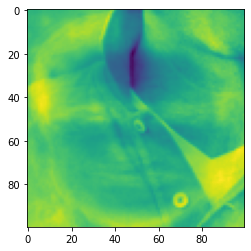

(222, 0, 372, 150)


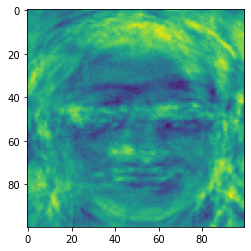

We classify this as a face
3272.3862969493603


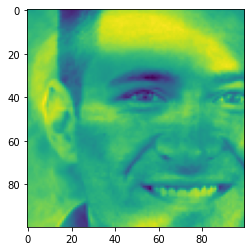

(222, 37, 372, 187)


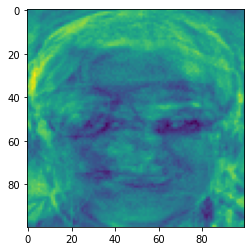

We classify this as a face
3481.3532687919014


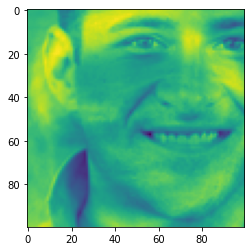

(222, 74, 372, 224)


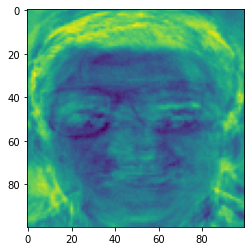

We classify this as a face
3390.225449191931


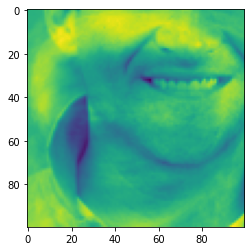

(222, 111, 372, 261)


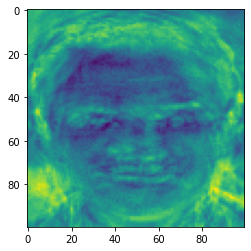

We classify this as a face
3300.649830798147


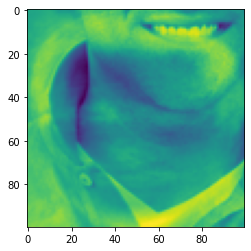

(222, 148, 372, 298)


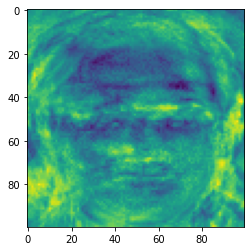

We classify this as a face
3304.790343393777


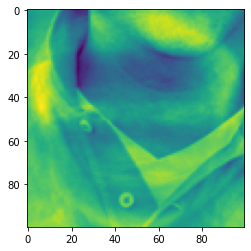

(259, 0, 409, 150)


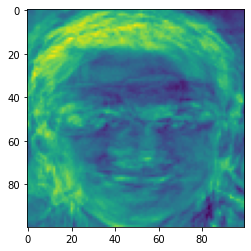

We classify this as a face
3168.520076429331


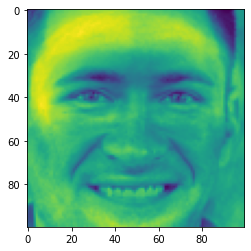

(259, 37, 409, 187)


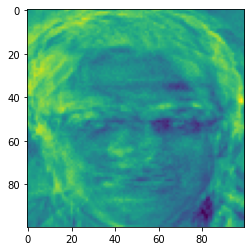

We classify this as a face
3067.337267282589


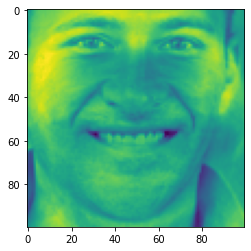

(259, 74, 409, 224)


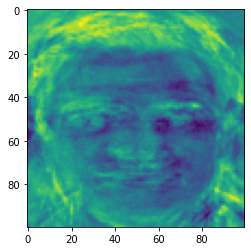

We classify this as a face
3192.565009333428


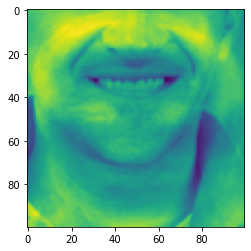

(259, 111, 409, 261)


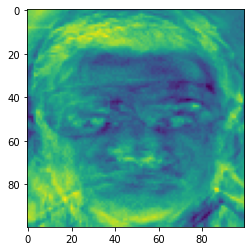

We classify this as a face
3102.646843825456


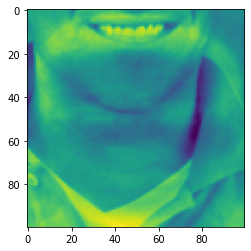

(259, 148, 409, 298)


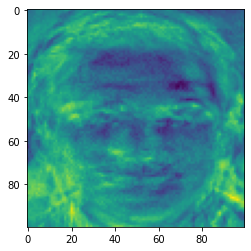

We classify this as a face
3479.4147926453375


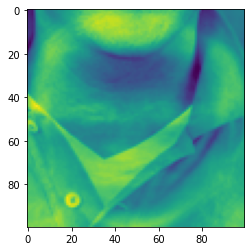

(296, 0, 446, 150)


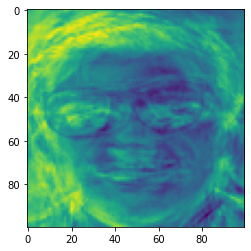

We classify this as a face
2825.476018874494


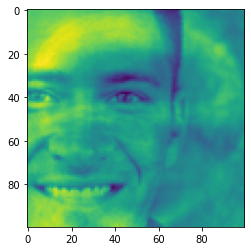

(296, 37, 446, 187)


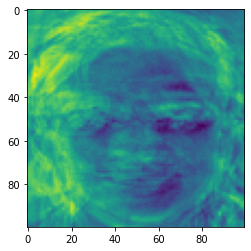

We classify this as a face
2683.623958741285


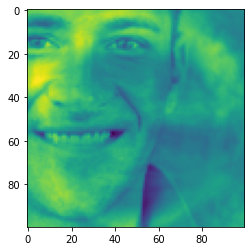

(296, 74, 446, 224)


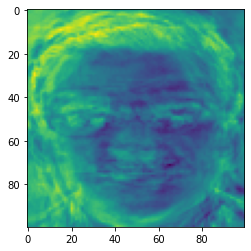

We classify this as a face
3028.5993167095494


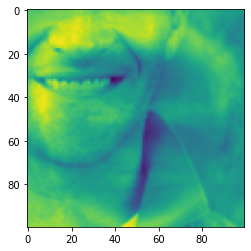

(296, 111, 446, 261)


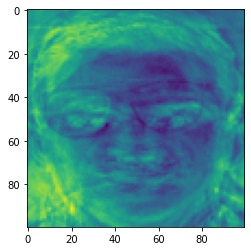

We classify this as a face
3133.918140110711


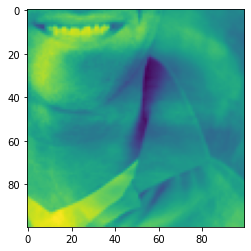

(296, 148, 446, 298)


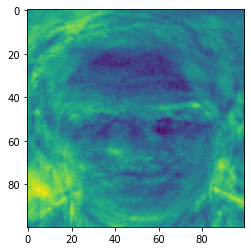

We classify this as a face
3124.758874379747


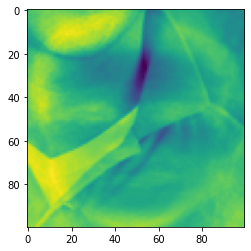

(333, 0, 483, 150)


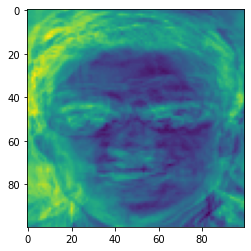

We classify this as a face
2575.8793645055757


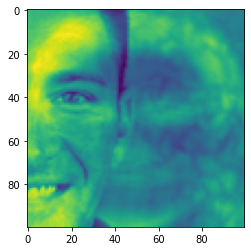

(333, 37, 483, 187)


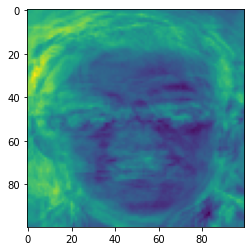

We classify this as a face
2300.485938973517


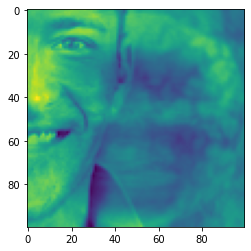

(333, 74, 483, 224)


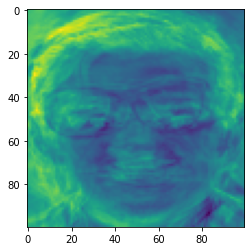

We classify this as a face
2536.088389586202


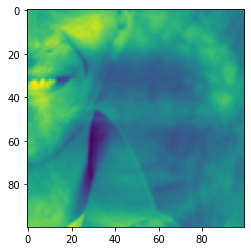

(333, 111, 483, 261)


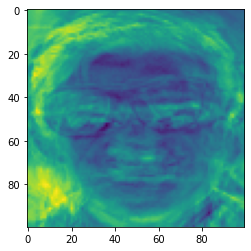

We classify this as a face
2816.704059601841


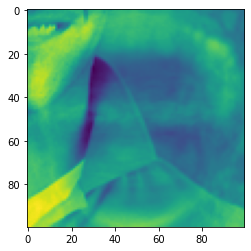

(333, 148, 483, 298)


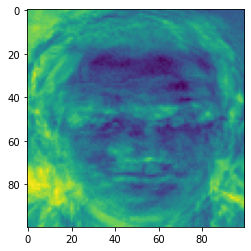

We classify this as a face
2701.9820060357565


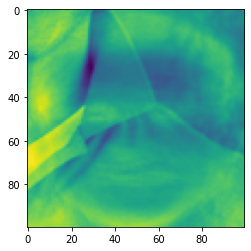

In [23]:
width = 150
height = 150
boxes = []
for i in range(0,img.width,int(width/4)):
        for j in range(0,img.height//2,int(height/4)):
            right = min((i+width),img.width)
            upper = j
            left = i
            lower = min((j + height),img.height)
            if right - left < width or lower-upper < height:
                continue
            bbox = (left,upper,right,lower)
            crop = img.crop(bbox).resize((size,size)).convert('L')
            print(bbox)
    #         plt.imshow(crop)
    #         plt.show()
            if solve(crop):
                boxes.append([left,right,upper,lower])

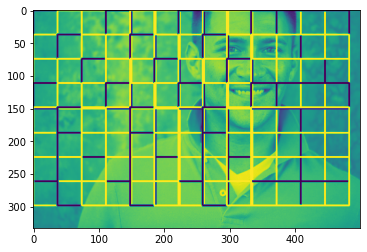

In [24]:
#top left
temp_img = img
for i in range(len(boxes)):
    if(boxes[i] == None):
        continue
    start_point = (boxes[i][0], boxes[i][2]) 

    # represents the bottom right corner of rectangle 
    end_point = (boxes[i][1], boxes[i][3]) 

    # Blue color in BGR 
    color = (255*(i%3), 255*(i+1%3),255*(i+2%3)) 

    # Line thickness of 2 px 
    thickness = 2

    # Using cv2.rectangle() method 
    # Draw a rectangle with blue line borders of thickness of 2 px 
    np_img = np.asarray(temp_img)
    image = cv2.rectangle(np_img, start_point, end_point, color, thickness) 
    temp_img = Image.fromarray(image)
plt.imshow(image)
plt.show()

In [25]:
boxes

[[0, 150, 0, 150],
 [0, 150, 37, 187],
 [0, 150, 74, 224],
 [0, 150, 111, 261],
 [0, 150, 148, 298],
 [37, 187, 0, 150],
 [37, 187, 37, 187],
 [37, 187, 74, 224],
 [37, 187, 111, 261],
 [37, 187, 148, 298],
 [74, 224, 0, 150],
 [74, 224, 37, 187],
 [74, 224, 74, 224],
 [74, 224, 111, 261],
 [74, 224, 148, 298],
 [111, 261, 0, 150],
 [111, 261, 37, 187],
 [111, 261, 74, 224],
 [111, 261, 111, 261],
 [111, 261, 148, 298],
 [148, 298, 0, 150],
 [148, 298, 37, 187],
 [148, 298, 74, 224],
 [148, 298, 111, 261],
 [148, 298, 148, 298],
 [185, 335, 0, 150],
 [185, 335, 37, 187],
 [185, 335, 74, 224],
 [185, 335, 111, 261],
 [185, 335, 148, 298],
 [222, 372, 0, 150],
 [222, 372, 37, 187],
 [222, 372, 74, 224],
 [222, 372, 111, 261],
 [222, 372, 148, 298],
 [259, 409, 0, 150],
 [259, 409, 37, 187],
 [259, 409, 74, 224],
 [259, 409, 111, 261],
 [259, 409, 148, 298],
 [296, 446, 0, 150],
 [296, 446, 37, 187],
 [296, 446, 74, 224],
 [296, 446, 111, 261],
 [296, 446, 148, 298],
 [333, 483, 0, 150],


In [26]:
merge_box(boxes,300)

NameError: name 'merge_box' is not defined

In [ ]:
#top left
temp_img = img

for i in range(len(boxes)):
    if(boxes[i] == None):
        continue
    start_point = (boxes[i][0], boxes[i][2]) 

    # represents the bottom right corner of rectangle 
    end_point = (boxes[i][1], boxes[i][3]) 


    # Blue color in BGR 
    color = (255*(i%3), 255*(i+1%3),255*(i+2%3)) 

    # Line thickness of 2 px 
    thickness = 2

    # Using cv2.rectangle() method 
    # Draw a rectangle with blue line borders of thickness of 2 px 
    np_img = np.asarray(temp_img)
    image = cv2.rectangle(np_img, start_point, end_point, color, thickness) 
    temp_img = Image.fromarray(image)
plt.imshow(image)
plt.show() 

In [ ]:
boxes

In [ ]:
def should_merge(box1, box2,close_dist):
    a = (box1[0], box1[2]), (box1[1], box1[3])
    b = (box2[0], box2[2]), (box2[1], box2[3])

    if any(abs(a_v - b_v) <= close_dist for i in range(2) for a_v, b_v in product(a[i], b[i])):
        return True, [min(*a[0], *b[0]), min(*a[1], *b[1]), max(*a[0], *b[0]), max(*a[1], *b[1])]

    return False, None

def merge_box(boxes, close_dist = 100):
    for i, box1 in enumerate(boxes):
        for j, box2 in enumerate(boxes[i + 1:]):
            is_merge, new_box = should_merge(box1, box2,close_dist)
            if is_merge:
                boxes[i] = None
                boxes[j] = new_box
                break